In [11]:
import pandas as pd
import geopandas as gpd
from shapely import wkb
import numpy as np


In [6]:
# Read the Feather file
df18 = pd.read_feather("/home/geethen/invasives/hypinvalimap/data/2018_extracted_data.feather")
df23 = pd.read_feather("/home/geethen/invasives/hypinvalimap/data/2023_extracted_data.feather")

# Convert geometry back from WKB
df18['geometry'] = df18['geometry'].apply(wkb.loads)

# Restore as a GeoDataFrame with correct CRS if needed
df18 = gpd.GeoDataFrame(df18, geometry='geometry', crs="EPSG:32734").to_crs("EPSG:4326")
df18

# Convert geometry back from WKB
df23['geometry'] = df23['geometry'].apply(wkb.loads)

# Restore as a GeoDataFrame with correct CRS if needed
df23 = gpd.GeoDataFrame(df23, geometry='geometry', crs="EPSG:4326")
df23

wavelength,geometry,377.19565,382.20566,387.21564,392.22565,397.22565,402.23566,407.24564,412.25565,417.26566,...,2455.7957,2460.8057,2465.8157,2470.8157,2475.8257,2480.8357,2485.8457,2490.8557,2495.8657,2500.8757
0,POINT (19.00879 -33.9911),0.014935,0.021665,0.027689,0.031128,0.031805,0.03197,0.035033,0.03688,0.036342,...,0.13415,0.142706,0.139535,0.15612,0.148241,0.171788,0.174089,0.180323,0.165728,0.190827
1,POINT (19.00823 -33.99113),0.014935,0.021665,0.027689,0.031128,0.031805,0.03197,0.035033,0.03688,0.036342,...,0.13415,0.142706,0.139535,0.15612,0.148241,0.171788,0.174089,0.180323,0.165728,0.190827
2,POINT (19.01091 -33.9917),0.014935,0.021665,0.027689,0.031128,0.031805,0.03197,0.035033,0.03688,0.036342,...,0.13415,0.142706,0.139535,0.15612,0.148241,0.171788,0.174089,0.180323,0.165728,0.190827
3,POINT (19.0071 -33.99783),0.014935,0.021665,0.027689,0.031128,0.031805,0.03197,0.035033,0.03688,0.036342,...,0.13415,0.142706,0.139535,0.15612,0.148241,0.171788,0.174089,0.180323,0.165728,0.190827
4,POINT (19.0014 -33.99701),0.014935,0.021665,0.027689,0.031128,0.031805,0.03197,0.035033,0.03688,0.036342,...,0.13415,0.142706,0.139535,0.15612,0.148241,0.171788,0.174089,0.180323,0.165728,0.190827
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1683,POINT (19.50658 -33.98428),0.014935,0.021665,0.027689,0.031128,0.031805,0.03197,0.035033,0.03688,0.036342,...,0.13415,0.142706,0.139535,0.15612,0.148241,0.171788,0.174089,0.180323,0.165728,0.190827
1684,POINT (19.50876 -33.98645),0.014935,0.021665,0.027689,0.031128,0.031805,0.03197,0.035033,0.03688,0.036342,...,0.13415,0.142706,0.139535,0.15612,0.148241,0.171788,0.174089,0.180323,0.165728,0.190827
1685,POINT (19.50898 -33.98638),0.014935,0.021665,0.027689,0.031128,0.031805,0.03197,0.035033,0.03688,0.036342,...,0.13415,0.142706,0.139535,0.15612,0.148241,0.171788,0.174089,0.180323,0.165728,0.190827
1686,POINT (19.50693 -33.98646),0.014935,0.021665,0.027689,0.031128,0.031805,0.03197,0.035033,0.03688,0.036342,...,0.13415,0.142706,0.139535,0.15612,0.148241,0.171788,0.174089,0.180323,0.165728,0.190827


In [81]:
change = gpd.read_file("/home/geethen/invasives/hypinvalimap/data/2018_2023_MgnChg.shp").dropna()
change['change'] = change['change'].astype(int)

m = change.explore(color = 'blue', name="change")
m = df18.explore(m=m, color="red", name="2018")

folium.LayerControl().add_to(m)
m


In [98]:
joined = df18.sjoin_nearest(change, how="left", distance_col="Distances").drop(columns=["index_right", "Distances", "2018_2023"])
joined['change'] = joined['change'].astype(int)
joined

,geometry,0.40661,0.41337,0.42013,0.42689,0.43367,0.44044,0.44723,0.45402,0.46082,...,1.78435,1.95847,1.96467,1.97087,1.97707,1.98326,1.98946,1.99566,change,notes
0,POINT (19.01091 -33.9917),1.0,1.0,21.0,32.0,53.0,72.0,86.0,87.0,81.0,...,806.0,103.0,108.0,112.0,117.0,121.0,126.0,130.0,1,less veg
1,POINT (19.00879 -33.9911),1.0,1.0,1.0,1.0,3.0,4.0,7.0,7.0,4.0,...,211.0,43.0,39.0,36.0,33.0,30.0,27.0,25.0,1,less veg
2,POINT (19.00823 -33.99113),1.0,1.0,13.0,36.0,62.0,75.0,78.0,75.0,69.0,...,641.0,76.0,81.0,84.0,88.0,93.0,98.0,103.0,1,less veg
3,POINT (19.0014 -33.99701),0.0,0.0,0.0,3.0,6.0,4.0,3.0,2.0,3.0,...,0.0,2.0,3.0,4.0,4.0,5.0,5.0,6.0,1,less veg
4,POINT (19.00051 -33.99803),1.0,1.0,1.0,1.0,8.0,14.0,16.0,15.0,8.0,...,1.0,4.0,5.0,5.0,6.0,7.0,6.0,7.0,1,less veg
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1683,POINT (19.49762 -33.99499),147.0,251.0,263.0,320.0,346.0,372.0,379.0,374.0,369.0,...,1884.0,1293.0,1288.0,1284.0,1281.0,1278.0,1272.0,1267.0,1,denser TC
1684,POINT (19.49639 -33.99409),206.0,292.0,337.0,409.0,464.0,510.0,543.0,565.0,569.0,...,2662.0,2062.0,2053.0,2046.0,2039.0,2031.0,2021.0,2013.0,1,denser TC
1685,POINT (19.4938 -33.99384),1.0,1.0,1.0,1.0,1.0,1.0,1.0,3.0,3.0,...,423.0,167.0,157.0,148.0,138.0,130.0,119.0,110.0,1,denser TC
1686,POINT (19.4932 -33.99476),1.0,1.0,1.0,4.0,8.0,9.0,14.0,15.0,16.0,...,738.0,379.0,367.0,353.0,341.0,328.0,313.0,300.0,1,denser TC


In [99]:
def plot_two_spectral_and_map(
    gdf1,
    gdf2,
    label1='Dataset 1',
    label2='Dataset 2',
    crs_from='EPSG:32734',
    crs_to='EPSG:4326',
    pick_index=None
):
    """
    Plot two spectral signatures in separate subplots and display a shared-location map.
    Assumes that spectral bands are columns named by wavelengths and geometry is Point.
    """
    import matplotlib.pyplot as plt
    import numpy as np
    from shapely.geometry import Point
    from pyproj import Transformer
    import folium
    import leafmap.foliumap as leafmap

    # Ensure CRS match
    if gdf1.crs != gdf2.crs:
        gdf2 = gdf2.to_crs(gdf1.crs)

    coords1 = set(gdf1.geometry.apply(lambda g: (g.x, g.y)))
    coords2 = set(gdf2.geometry.apply(lambda g: (g.x, g.y)))
    common_coords = list(coords1 & coords2)
    if not common_coords:
        raise ValueError("No overlapping coordinates between GeoDataFrames.")
    


    # Select point
    if pick_index is not None:
        x_pick, y_pick = common_coords[pick_index]
    else:
        x_pick, y_pick = random.choice(common_coords)

    # Get rows
    point = Point(x_pick, y_pick)
    row1 = gdf1[gdf1.geometry == point].iloc[0]
    row2 = gdf2[gdf2.geometry == point].iloc[0]

    # Extract reflectance values and convert wavelength strings to float
    wl1 = np.array([float(col) for col in gdf1.columns if col not in ['geometry', 'change', 'notes']])
    refl1 = np.array(row1[wl1.astype(str)].values, dtype=float)/10000.0

    # Dataset 2 (2023): divide both wavelength and reflectance by 1000
    wl2_raw = [col for col in gdf2.columns if col != 'geometry']
    wl2 = np.array([float(w) / 1000.0 for w in wl2_raw])  # wavelengths in µm
    refl2 = np.array(row2[wl2_raw].values, dtype=float)


    # Atmospheric windows
    windows = [(0.400, 1.340), (1.455, 1.790), (1.955, 2.400)]

    # Plot
    fig, axes = plt.subplots(1, 2, figsize=(12, 5))
    for ax, wl, refl, label in zip(axes, [wl1, wl2], [refl1, refl2], [label1, label2]):
        ax.plot(wl, refl, label=label, color='green')
        for start, end in windows:
            ax.axvspan(start, end, color='gray', alpha=0.2)
        ax.set_title(label)
        ax.set_xlabel("Wavelength (μm)")
        ax.grid(True)

    axes[0].set_ylabel("Reflectance")
    fig.suptitle(f"Spectral Signatures at ({x_pick:.2f}, {y_pick:.2f})")
    plt.tight_layout(rect=[0, 0, 1, 0.95])

    # Map
    transformer = Transformer.from_crs(crs_from, crs_to, always_xy=True)
    lon, lat = transformer.transform(x_pick, y_pick)

    m = leafmap.Map(
        center=[lat, lon],
        zoom=15,
        basemap='Esri.WorldImagery',
        draw_control=False,
        measure_control=False,
        fullscreen_control=False
    )

    folium.Marker(
        [lat, lon],
        popup=f'Point: ({x_pick:.2f}, {y_pick:.2f})',
        icon=folium.Icon(color='green')
    ).add_to(m)

    for gdf, color, label in [(gdf1, 'red', label1), (gdf2, 'blue', label2)]:
        xmin, ymin, xmax, ymax = gdf.total_bounds
        lon_min, lat_min = transformer.transform(xmin, ymin)
        lon_max, lat_max = transformer.transform(xmax, ymax)
        folium.Rectangle(
            bounds=[[lat_min, lon_min], [lat_max, lon_max]],
            color=color,
            weight=2,
            fill=False,
            tooltip=f"{label} extent"
        ).add_to(m)

    print("Change status for matching row:")
    print(row1['change'])

    return fig, m, (x_pick, y_pick, lon, lat)


Change status for matching row:
0


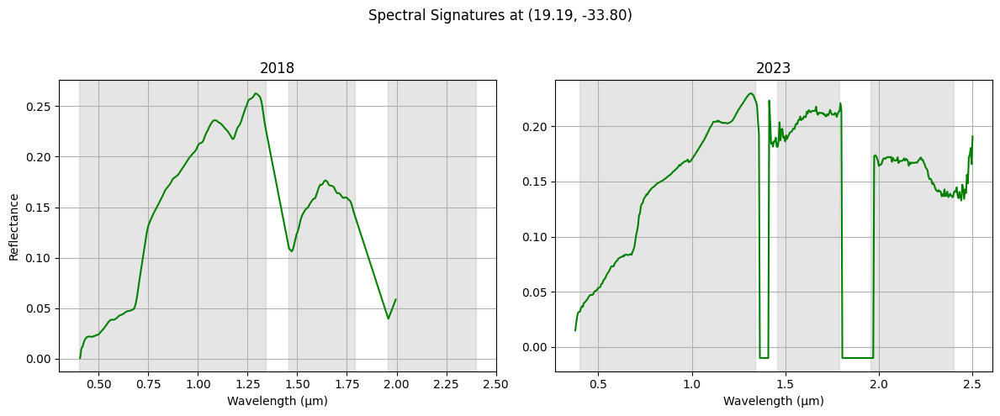

In [105]:
fig, m, (x, y, lon, lat) = plot_two_spectral_and_map(
    gdf1=joined,
    gdf2=df23,
    label1='2018',
    label2='2023',
    crs_from='EPSG:4326',
    crs_to='EPSG:4326',
    pick_index=50
)

plt.show()
m
